In [1]:
import numpy as np
import torch
import os
import cv2
from imutils import paths
from scipy import misc
import random
import torch
import torchvision
import pandas as pd
import matplotlib.pyplot as plt
import torchvision
%matplotlib inline

In [5]:
data=pd.read_csv("C:\\Users\\SATWIK\\PycharmProjects\\test\\HAM10000_metadata.csv")

In [3]:
data

,lesion_id,image_id,dx,dx_type,age,sex,localization
0,HAM_0000118,ISIC_0027419,bkl,histo,80.0,male,scalp
1,HAM_0000118,ISIC_0025030,bkl,histo,80.0,male,scalp
2,HAM_0002730,ISIC_0026769,bkl,histo,80.0,male,scalp
3,HAM_0002730,ISIC_0025661,bkl,histo,80.0,male,scalp
4,HAM_0001466,ISIC_0031633,bkl,histo,75.0,male,ear
...,...,...,...,...,...,...,...
10010,HAM_0002867,ISIC_0033084,akiec,histo,40.0,male,abdomen
10011,HAM_0002867,ISIC_0033550,akiec,histo,40.0,male,abdomen
10012,HAM_0002867,ISIC_0033536,akiec,histo,40.0,male,abdomen
10013,HAM_0000239,ISIC_0032854,akiec,histo,80.0,male,face


In [100]:
akiec=[]
bcc=[]
bkl=[]
mel=[]
nv=[]
vasc=[]
df=[]

count=0
for id,dx in zip(data["image_id"],data["dx"]):
    count+=1

    file="C:\\Users\\SATWIK\\PycharmProjects\\test\\HAM10000_images_part_2\\"+id+".jpg"
    #print(file)
    #print(dx)

    #print("hi")
    if os.path.isfile(file):
        #print(file)
    
        img=cv2.imread(file)
        img=misc.imresize(img,(64,64)) 
        #print(img.shape)
        if dx=="akiec":
            akiec.append(img)
        elif dx=="bcc":
            bcc.append(img)
        elif dx=="bkl":
            bkl.append(img)
        elif dx=="mel":
            mel.append(img)
        elif dx=="nv":
            nv.append(img)
        elif dx=="vasc":
            vasc.append(img)
        elif dx=="df":
            df.append(img)

akiec=np.array(akiec)
bcc=np.array(bcc)
bkl=np.array(bkl)
mel=np.array(mel)
nv=np.array(nv)
vasc=np.array(vasc)
df=np.array(df)   

In [16]:
len(akiec)+len(bcc)+len(mel)

1070

In [17]:
len(df)+len(bkl)

594

In [101]:
df.shape

(59, 64, 64, 3)

In [103]:
np.savez("C:\\Users\\SATWIK\\PycharmProjects\\test\\2.npz",akiec=akiec,
bcc=bcc,
bkl=bkl,
mel=mel,
nv=nv,
vasc=vasc,
df=df)

In [ ]:
akiec,bcc,mel       bkl,df,             nv vasc idk

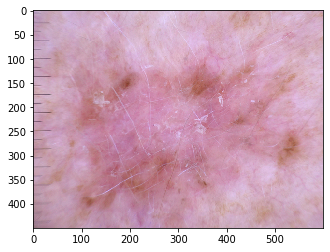

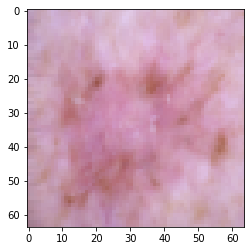

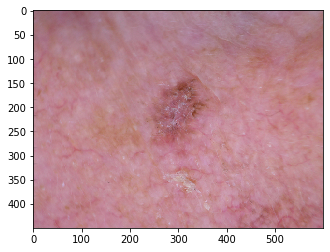

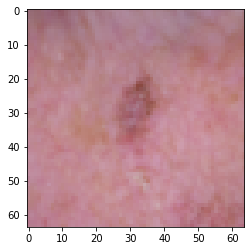

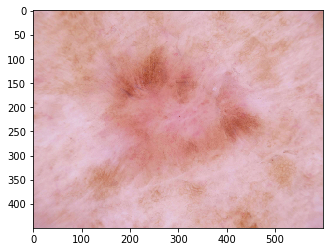

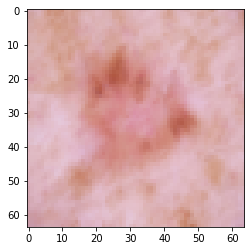

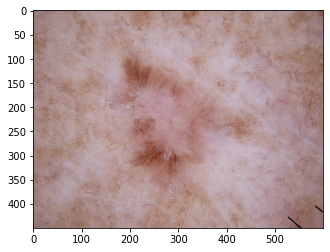

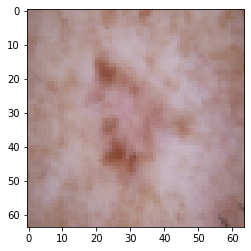

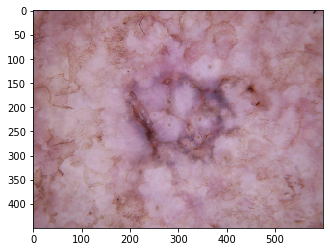

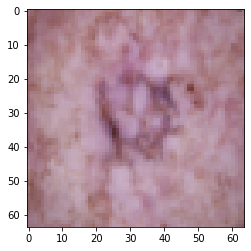

In [69]:
for i in range(5):
    plt.imshow(cv2.cvtColor(akiec[i], cv2.COLOR_BGR2RGB))
    plt.show()
    plt.imshow(cv2.cvtColor(misc.imresize(akiec[i],(64,64)) ,cv2.COLOR_BGR2RGB))
    plt.imsave("C:\\Users\\SATWIK\\PycharmProjects\\test\\"+str(i)+".jpg",misc.imresize(akiec[i],(32,32)))    
    plt.show()
    

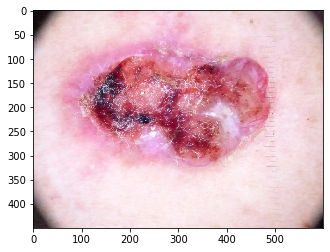

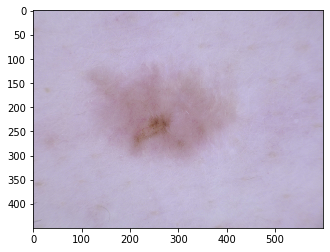

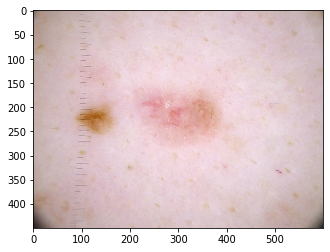

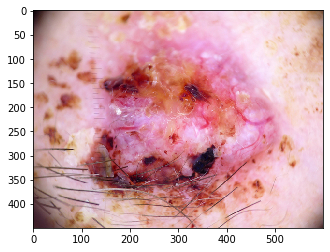

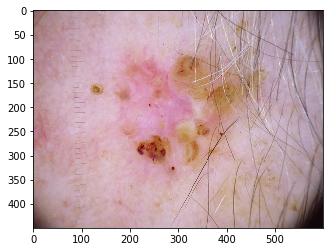

In [30]:
for i in range(5):
    plt.imshow(cv2.cvtColor(akiec[i], cv2.COLOR_BGR2RGB))
    plt.show()

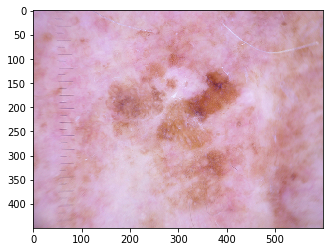

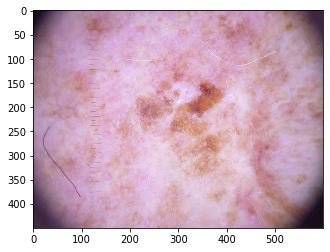

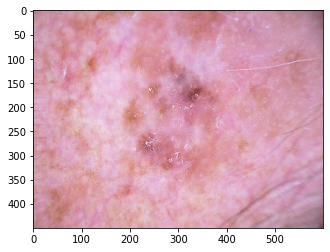

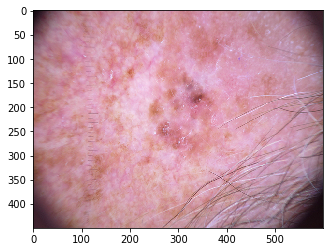

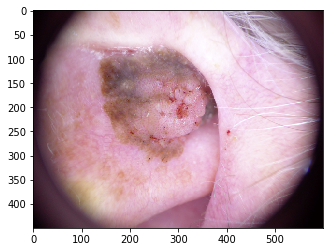

In [31]:
for i in range(5):
    plt.imshow(cv2.cvtColor(bkl[i], cv2.COLOR_BGR2RGB))
    plt.show()

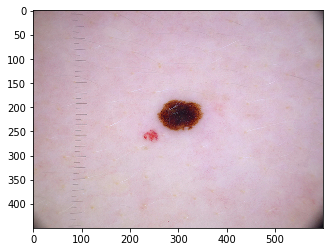

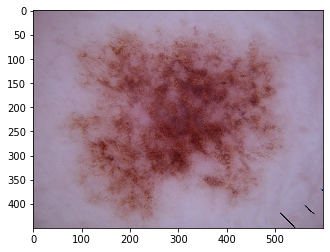

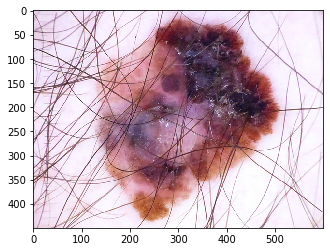

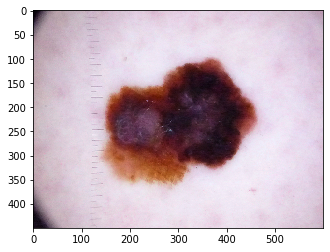

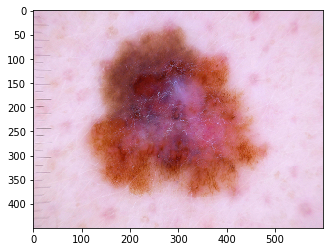

In [32]:
for i in range(5):
    plt.imshow(cv2.cvtColor(mel[i], cv2.COLOR_BGR2RGB))
    plt.show()

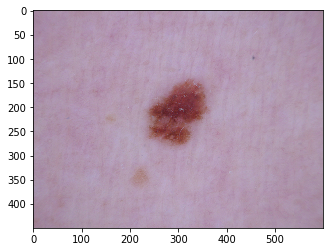

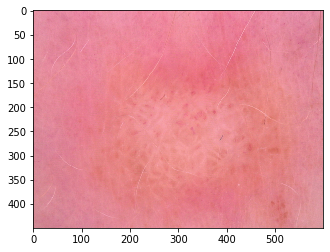

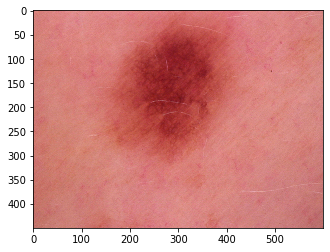

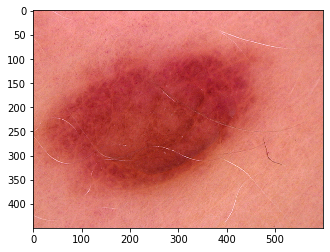

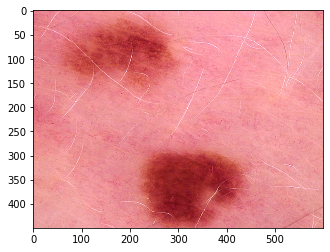

In [33]:
for i in range(5):
    plt.imshow(cv2.cvtColor(nv[i], cv2.COLOR_BGR2RGB))
    plt.show()

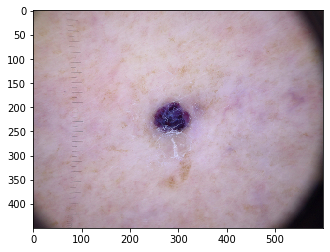

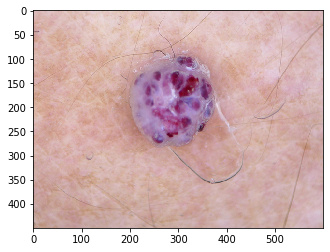

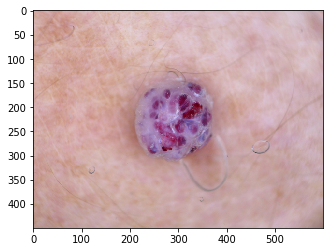

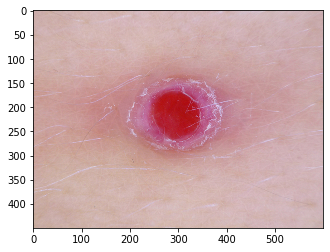

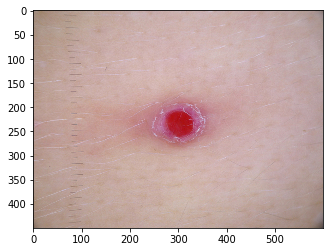

In [34]:
for i in range(5):
    plt.imshow(cv2.cvtColor(vasc[i], cv2.COLOR_BGR2RGB))
    plt.show()

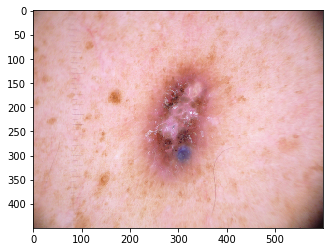

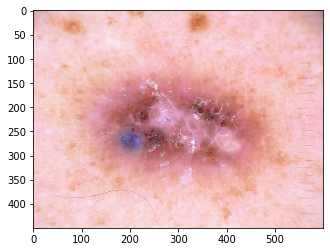

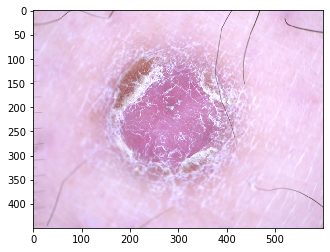

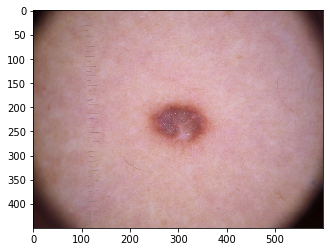

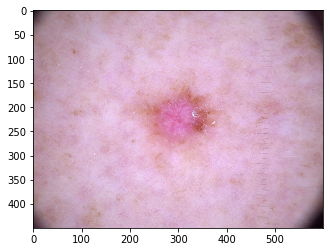

In [61]:
for i in range(5):
    plt.imshow(cv2.cvtColor(df[i], cv2.COLOR_BGR2RGB))
    plt.show()

In [ ]:
akiec,bcc,mel       bkl,df,             nv vasc idk

In [104]:
f1=np.load("1.npz")
f2=np.load("2.npz")

In [105]:
akiec=np.concatenate((f1["akiec"],f2["akiec"]))
bcc=np.concatenate((f1["bcc"],f2["bcc"]))
mel=np.concatenate((f1["mel"],f2["mel"]))
bkl=np.concatenate((f1["bkl"],f2["bkl"]))
df=np.concatenate((f1["df"],f2["df"]))
nv=np.concatenate((f1["nv"],f2["nv"]))
vasc=np.concatenate((f1["vasc"],f2["vasc"]))

In [106]:
bkl.shape

(1099, 64, 64, 3)

In [107]:
df.shape

(115, 64, 64, 3)

In [108]:
nv.shape

(6705, 64, 64, 3)

In [109]:
train_bkl=bkl[:599]
test_bkl=bkl[599:]
train_df=df[:65]
test_df=df[65:]
test_nv=nv[:1400]
train_nv=nv[1400:4400]

In [114]:
train_beg.shape

(3664, 64, 64, 3)

In [115]:
test_beg.shape

(1950, 64, 64, 3)

In [116]:
mal.shape

(1954, 64, 64, 3)

In [113]:
mal=np.concatenate((akiec,bcc,mel))
test_beg=np.concatenate((test_bkl,test_df,test_nv))
train_beg=np.concatenate((train_bkl,train_df,train_nv))

In [117]:
train_lbl=[]
for i in range(len(train_beg)):
    train_lbl.append(1)
train_lbl=np.array(train_lbl)

In [118]:
test_lbl=[]
for i in range(len(test_beg)):
    test_lbl.append(1)
for i in range(len(mal)):
    test_lbl.append(0)
test_lbl=np.array(test_lbl)

In [119]:
test_data=np.concatenate((test_beg,mal))
train_data=train_beg

In [120]:
train_data.shape

(3664, 64, 64, 3)

In [121]:
test_data.shape

(3904, 64, 64, 3)

In [122]:
train_data=torch.tensor(train_data)
train_lbl=torch.tensor(train_lbl)
test_data=torch.tensor(test_data)
test_lbl=torch.tensor(test_lbl)


In [123]:
transform = torchvision.transforms.Compose([torchvision.transforms.ToTensor()])
train=torchvision.datasets.CIFAR10(root="./",download=True,train=True,transform=transform)
test=torchvision.datasets.CIFAR10(root="./",download=True,train=False,transform=transform)

Files already downloaded and verified
Files already downloaded and verified


In [124]:
train.data=train_data
train.targets=train_lbl
test.data=test_data
test.targets=test_lbl

In [125]:
torch.save(train,"train.pt")
torch.save(test,"test.pt")